In [2]:
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
# from scipy.stats import signaltonoise
# from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit


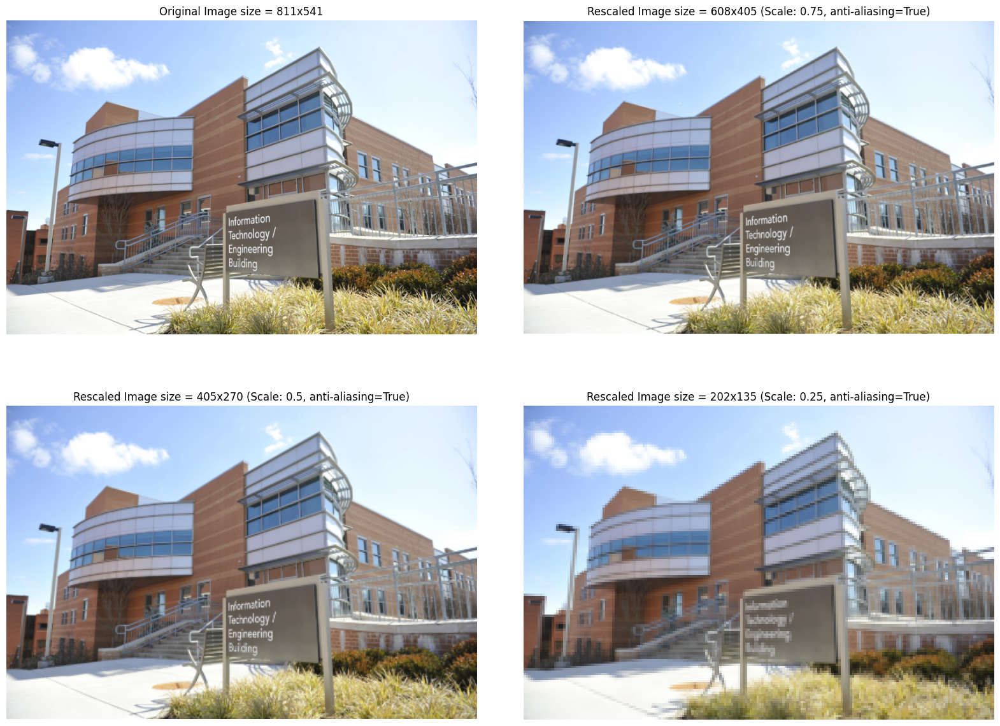

In [8]:
from skimage.io import imread
from skimage.transform import resize
import pylab

# Đọc ảnh
im = imread('./images/umbc.png')
im1 = im.copy()

# Hiển thị 4 ảnh (1 ảnh gốc + 3 ảnh đã down-sample)
pylab.figure(figsize=(20, 15))

# Ảnh gốc
pylab.subplot(2, 2, 1)
pylab.imshow(im1, cmap='gray')
pylab.axis('off')
pylab.title('Original Image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))

# Down-sample ảnh với các tỷ lệ khác nhau và anti-aliasing
scales = [0.75, 0.5, 0.25]  # Các tỷ lệ down-sample
for i, scale in enumerate(scales, 2):
    im_rescaled = resize(im1, (int(im1.shape[0] * scale), int(im1.shape[1] * scale)), anti_aliasing=True)
    pylab.subplot(2, 2, i)
    pylab.imshow(im_rescaled, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Rescaled Image size = {im_rescaled.shape[1]}x{im_rescaled.shape[0]} (Scale: {scale}, anti-aliasing=True)')

# Căn chỉnh các ảnh
pylab.subplots_adjust(wspace=0.1, hspace=0.1)

# Hiển thị
pylab.show()


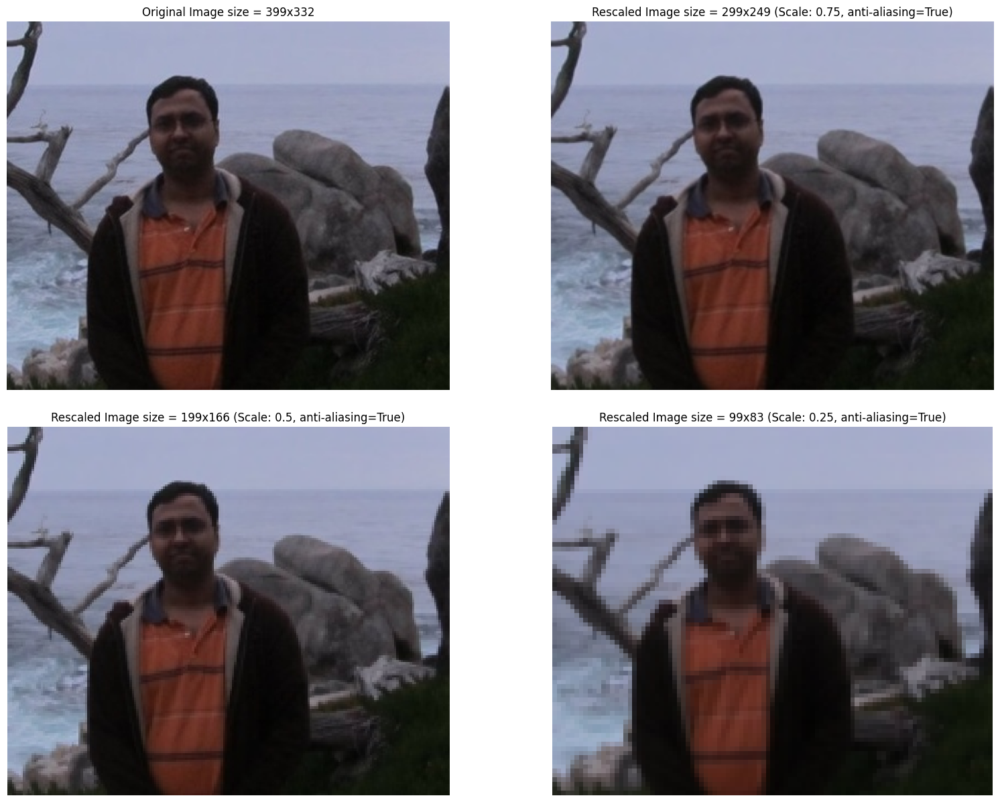

In [11]:
from skimage.io import imread
from skimage.transform import resize
import pylab

# Đọc ảnh
im = imread('./images/me.jpg')
im1 = im.copy()

# Hiển thị 4 ảnh (1 ảnh gốc + 3 ảnh đã down-sample)
pylab.figure(figsize=(20, 15))

# Ảnh gốc
pylab.subplot(2, 2, 1)
pylab.imshow(im1, cmap='gray')
pylab.axis('off')
pylab.title('Original Image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))

# Down-sample ảnh với các tỷ lệ khác nhau và anti-aliasing
scales = [0.75, 0.5, 0.25]  # Các tỷ lệ down-sample
for i, scale in enumerate(scales, 2):
    im_rescaled = resize(im1, (int(im1.shape[0] * scale), int(im1.shape[1] * scale)), anti_aliasing=True)
    pylab.subplot(2, 2, i)
    pylab.imshow(im_rescaled, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Rescaled Image size = {im_rescaled.shape[1]}x{im_rescaled.shape[0]} (Scale: {scale}, anti-aliasing=True)')

# Căn chỉnh các ảnh
pylab.subplots_adjust(wspace=0.1, hspace=0.1)

# Hiển thị
pylab.show()


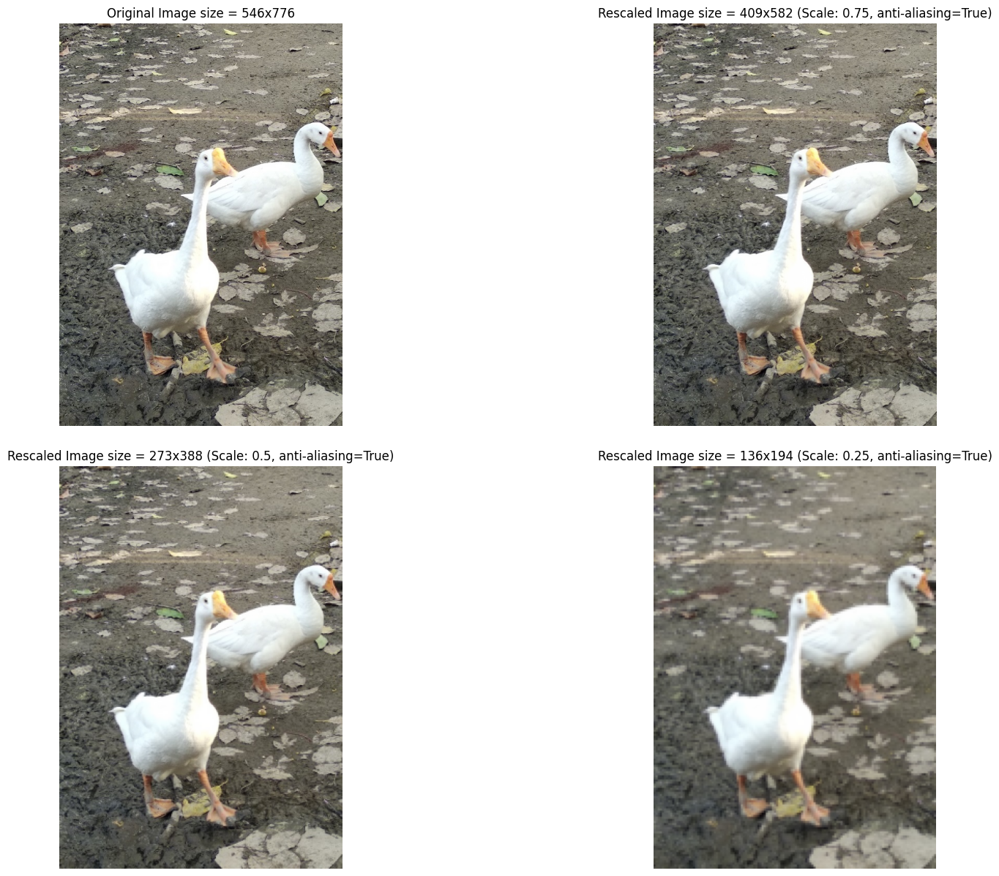

In [13]:
from skimage.io import imread
from skimage.transform import resize
import pylab

# Đọc ảnh
im = imread('./images/swans.jpg')
im1 = im.copy()

# Hiển thị 4 ảnh (1 ảnh gốc + 3 ảnh đã down-sample)
pylab.figure(figsize=(20, 15))

# Ảnh gốc
pylab.subplot(2, 2, 1)
pylab.imshow(im1, cmap='gray')
pylab.axis('off')
pylab.title('Original Image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))

# Down-sample ảnh với các tỷ lệ khác nhau và anti-aliasing
scales = [0.75, 0.5, 0.25]  # Các tỷ lệ down-sample
for i, scale in enumerate(scales, 2):
    im_rescaled = resize(im1, (int(im1.shape[0] * scale), int(im1.shape[1] * scale)), anti_aliasing=True)
    pylab.subplot(2, 2, i)
    pylab.imshow(im_rescaled, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Rescaled Image size = {im_rescaled.shape[1]}x{im_rescaled.shape[0]} (Scale: {scale}, anti-aliasing=True)')

# Căn chỉnh các ảnh
pylab.subplots_adjust(wspace=0.1, hspace=0.1)

# Hiển thị
pylab.show()


The FFT with the scipy.fftpack module

SNR for the original image = 0.4274378018167937
SNR for the image obtained after reconstruction = 0.42743780181679375


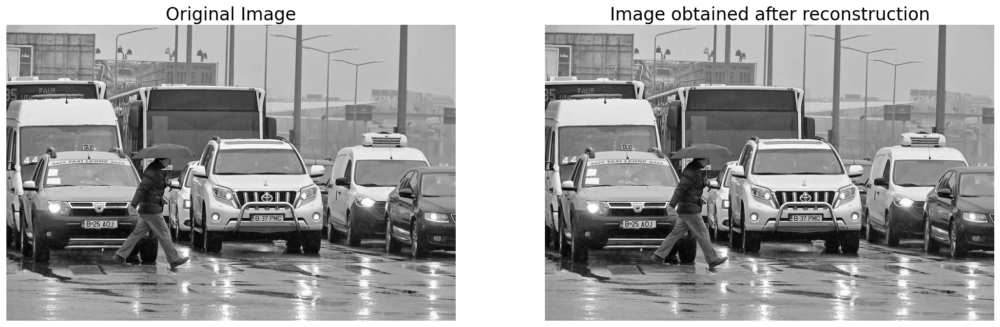

In [47]:
import numpy as np
import pylab
from scipy import fftpack as fp
from PIL import Image
from skimage.measure import shannon_entropy # Import the necessary function for signal-to-noise ratio (SNR)

# Read and convert the image to grayscale
im = np.array(Image.open('./images/cars.jpg').convert('L'))  # we shall work with grayscale image

# Calculate the Signal-to-Noise Ratio (SNR) for the original image
snr = np.std(im) / np.mean(im)  # Alternatively, you can use the 'signaltonoise' function from 'skimage.measure'
print('SNR for the original image = ' + str(snr))

# Perform FFT and IFFT
freq = fp.fft2(im)
im1 = fp.ifft2(freq).real

# Calculate the SNR for the reconstructed image
snr_reconstructed = np.std(im1) / np.mean(im1)  # Similarly calculate for the reconstructed image
print('SNR for the image obtained after reconstruction = ' + str(snr_reconstructed))

# Assert that the original and reconstructed images are very close to each other
assert(np.allclose(im, im1))  # make sure the forward and inverse FFT are close to each other

# Display the original and reconstructed images
pylab.figure(figsize=(20,10))
pylab.subplot(121), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Original Image', size=20)
pylab.subplot(122), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
pylab.title('Image obtained after reconstruction', size=20)
pylab.show()


C:\Users\PC\AppData\Local\Temp\ipykernel_860\3554414684.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 +freq2)).astype(int)), pylab.show()


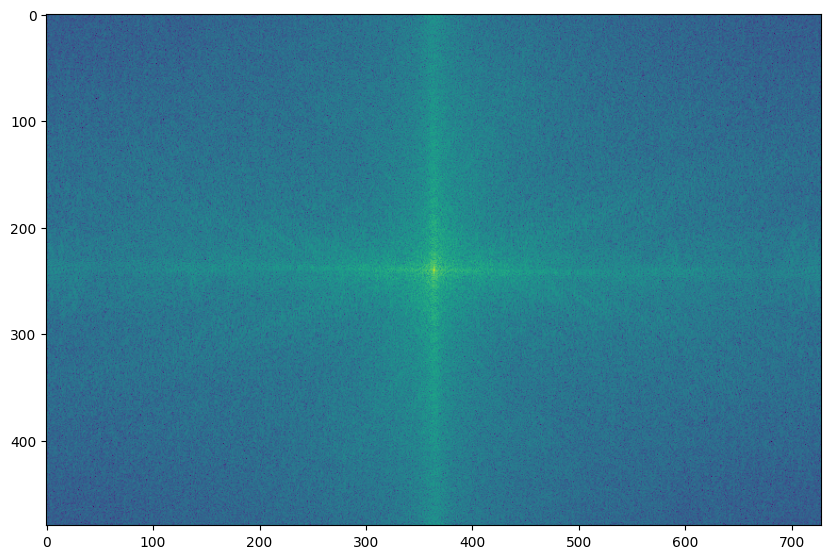

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [48]:
freq2 = fp.fftshift(freq)
pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 +freq2)).astype(int)), pylab.show()


•	The FFT with the numpy.fft module

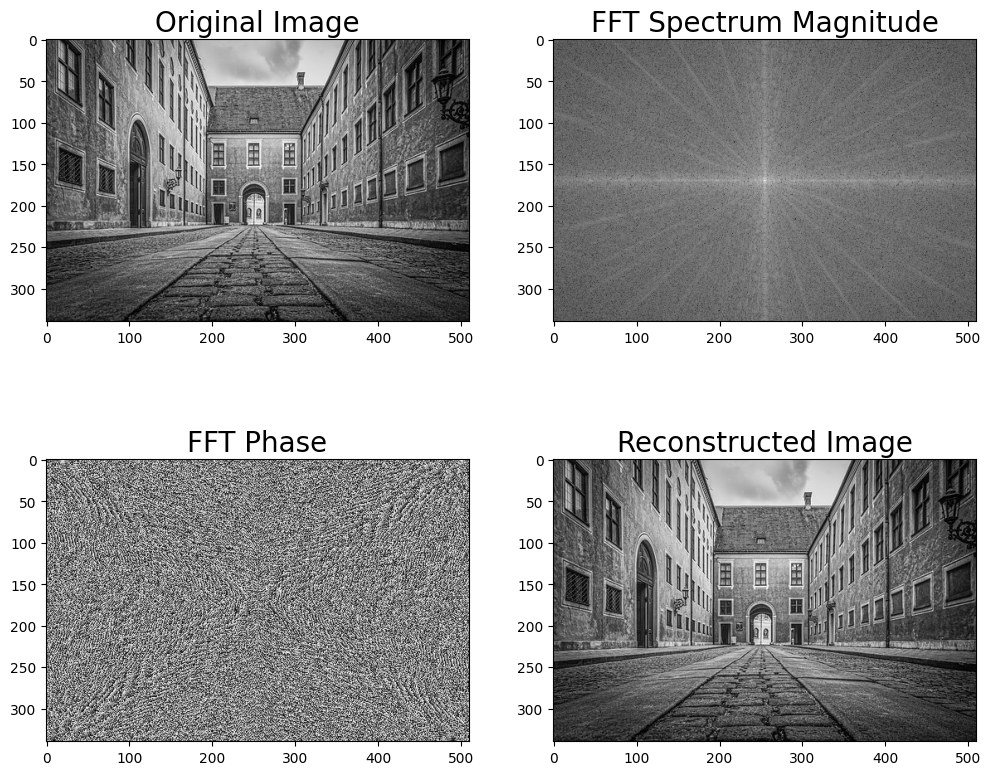

In [38]:
import numpy as np
import pylab
from skimage.color import rgb2gray
from skimage.io import imread
from PIL import Image

# Đọc ảnh và chuyển từ RGBA sang RGB nếu cần
im = imread('./images/house.png')
if im.shape[2] == 4:  # Nếu ảnh có 4 kênh (RGBA), chuyển thành RGB
    im = im[:, :, :3]

# Chuyển đổi ảnh sang ảnh grayscale
im1 = rgb2gray(im)

# Thực hiện FFT và IFFT
pylab.figure(figsize=(12,10))
freq1 = np.fft.fft2(im1)
im1_ = np.fft.ifft2(freq1).real

# Hiển thị các ảnh
pylab.subplot(2,2,1), pylab.imshow(im1, cmap='gray'), pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10( 0.01 + np.abs(np.fft.fftshift(freq1))), cmap='gray')
pylab.title('FFT Spectrum Magnitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(np.fft.fftshift(freq1)), cmap='gray')
pylab.title('FFT Phase', size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im1_, 0, 255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()


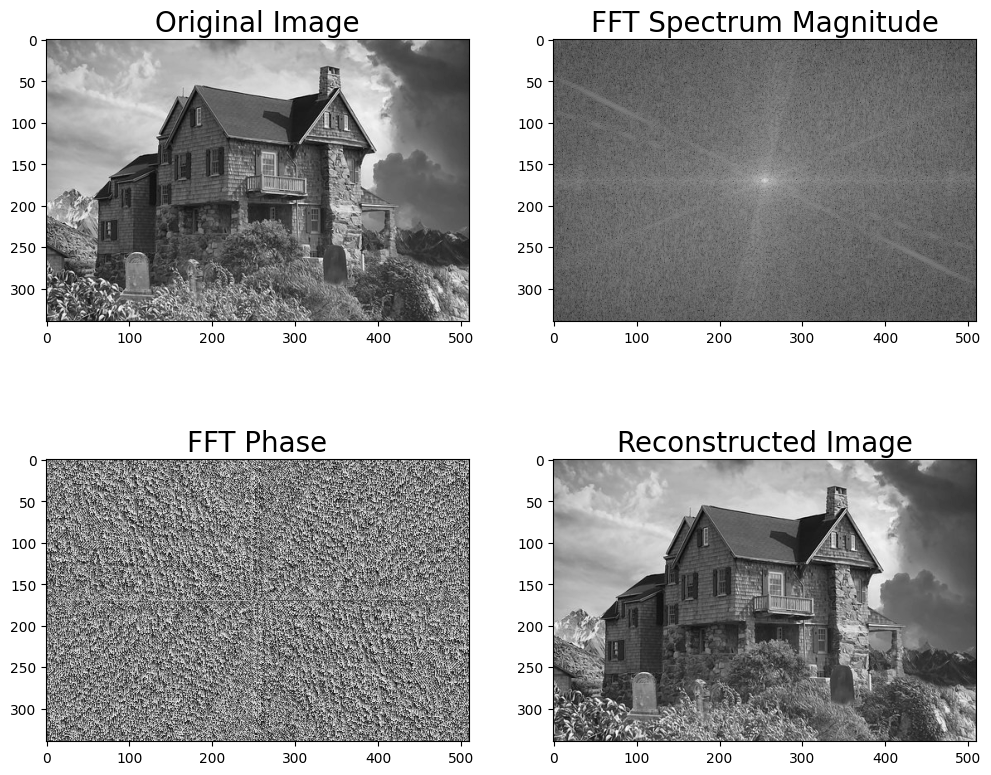

In [39]:
import numpy as np
import pylab
from skimage.color import rgb2gray
from skimage.io import imread
from PIL import Image

# Đọc ảnh và chuyển từ RGBA sang RGB nếu cần
im = imread('./images/house2.png')
if im.shape[2] == 4:  # Nếu ảnh có 4 kênh (RGBA), chuyển thành RGB
    im = im[:, :, :3]

# Chuyển đổi ảnh sang ảnh grayscale
im1 = rgb2gray(im)

# Thực hiện FFT và IFFT
pylab.figure(figsize=(12,10))
freq1 = np.fft.fft2(im1)
im1_ = np.fft.ifft2(freq1).real

# Hiển thị các ảnh
pylab.subplot(2,2,1), pylab.imshow(im1, cmap='gray'), pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10( 0.01 + np.abs(np.fft.fftshift(freq1))), cmap='gray')
pylab.title('FFT Spectrum Magnitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(np.fft.fftshift(freq1)), cmap='gray')
pylab.title('FFT Phase', size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im1_, 0, 255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()


(340, 510) (340, 503)


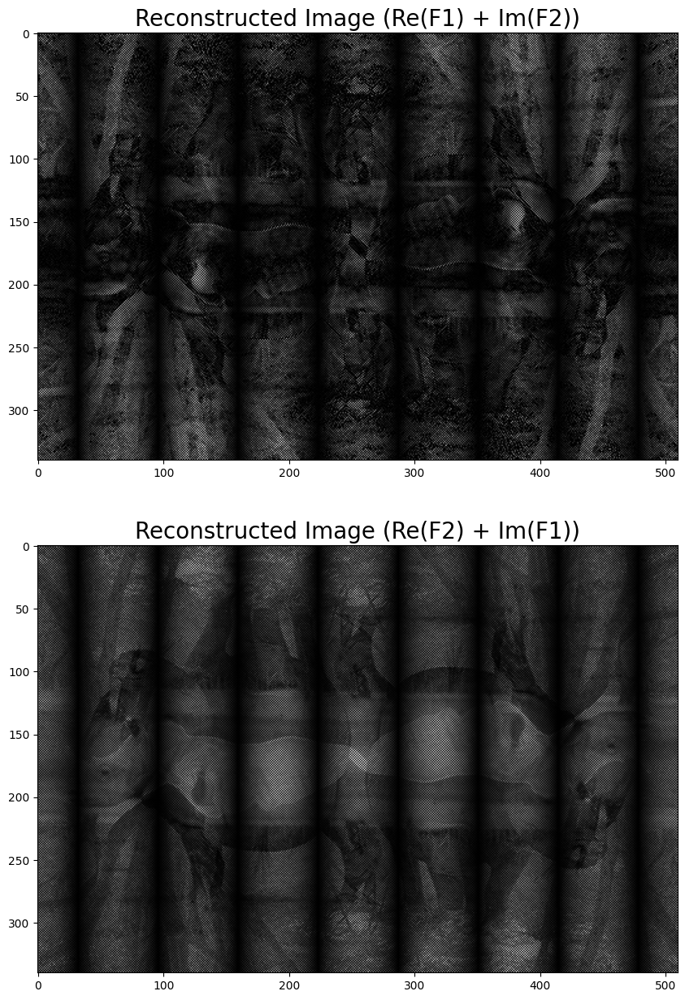

In [40]:
# Kiểm tra kích thước của freq1 và freq2
print(freq1.shape, freq2.shape)

# Thêm padding vào freq2 nếu cần thiết
if freq1.shape != freq2.shape:
    freq2 = np.pad(freq2, ((0, freq1.shape[0] - freq2.shape[0]), (0, freq1.shape[1] - freq2.shape[1])), mode='constant')

# Sau khi làm cho chúng có cùng kích thước, thực hiện phép toán
im1_ = fp.ifft2(np.vectorize(complex)(freq1.real, freq2.imag)).real
im2_ = fp.ifft2(np.vectorize(complex)(freq2.real, freq1.imag)).real

# Hiển thị kết quả
pylab.figure(figsize=(20,15))
pylab.subplot(211), pylab.imshow(np.clip(im1_, 0, 255), cmap='gray')
pylab.title('Reconstructed Image (Re(F1) + Im(F2))', size=20)
pylab.subplot(212), pylab.imshow(np.clip(im2_, 0, 255), cmap='gray')
pylab.title('Reconstructed Image (Re(F2) + Im(F1))', size=20)
pylab.show()


Applying convolution to a grayscale image

0.8506227450980391
(340, 348)


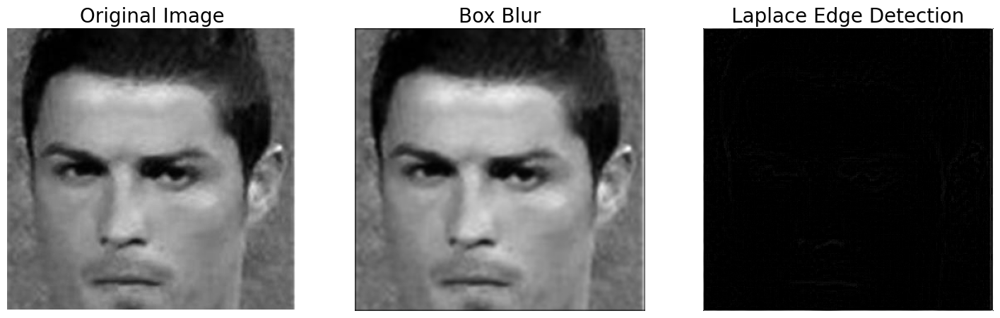

In [54]:
im = rgb2gray(imread('./images/ronaldo.jpg')).astype(float)
print(np.max(im))
# 1.0
print(im.shape)
# (225, 225)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18, 6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
pylab.show()
